(In order to load the stylesheet of this notebook, execute the last code cell in this notebook)

# Stack Overflow

## Introduction 

In this assignment, we will look at some posts on Stack Overflow during the year of 2015 and measure the similarity of users by looking at the types of questions they answer. We will also analyze the creation dates of questions.

## Step 0. Preparation

Before we start working on the notebook, let's make sure that everything is setup properly. You should have downloaded and installed
* [Anaconda](https://store.continuum.io/cshop/anaconda/)
* [Git](http://git-scm.com/downloads)

If you are working from the undergraduate lab (on a linux machine) these are both installed, but you need to follow the instructions [from here](https://github.com/datascience16/lectures/blob/master/Lecture2/Getting-Started.ipynb).



## Step 1. Getting the data

Let's make a sample request to retrieve the questions posted on Stack Exchange on the first day of 2015. Documentation of the Stack Exchange API can be found [here](https://api.stackexchange.com/docs).

In [1]:
import requests

start_time = 1420070400 # 01-01-2015 at 00:00:00
end_time   = 1420156800 # 01-02-2015 at 00:00:00

response = requests.get("https://api.stackexchange.com/2.2/questions?pagesize=100" +
                        "&fromdate=" + str(start_time) + "&todate=" + str(end_time) +
                        "&order=asc&sort=creation&site=stackoverflow")
print response

<Response [200]>


All dates in the Stack Exchange API are in [unix epoch time](https://en.wikipedia.org/wiki/Unix_time). The format for the request string is specified [here](https://api.stackexchange.com/docs/questions).

We can try to print the response that Stack Exchange returns.

In [2]:
print response.text

{"items":[{"tags":["php","mysql","arrays","mysqli"],"owner":{"reputation":156,"user_id":3210431,"user_type":"registered","accept_rate":78,"profile_image":"https://i.stack.imgur.com/QTjBV.jpg?s=128&g=1","display_name":"salep","link":"http://stackoverflow.com/users/3210431/salep"},"is_answered":true,"view_count":199,"accepted_answer_id":27727478,"answer_count":2,"score":0,"last_activity_date":1420071815,"creation_date":1420070458,"question_id":27727385,"link":"http://stackoverflow.com/questions/27727385/inserting-multiple-records-into-mysql-from-an-array","title":"Inserting multiple records into MySQL from an array"},{"tags":["apache-pig"],"owner":{"reputation":6,"user_id":868779,"user_type":"registered","profile_image":"https://www.gravatar.com/avatar/19f7315b44e97ca1bc069694fdba7428?s=128&d=identicon&r=PG","display_name":"Balpreet Pankaj","link":"http://stackoverflow.com/users/868779/balpreet-pankaj"},"is_answered":false,"view_count":223,"answer_count":1,"score":1,"last_activity_date":

It is not possible to read the raw response. Instead, we need to decode the raw response as JSON and use the `json` library to print it.

In [3]:
import json

print json.dumps(response.json(), indent=2)

{
  "has_more": true, 
  "items": [
    {
      "is_answered": true, 
      "view_count": 199, 
      "tags": [
        "php", 
        "mysql", 
        "arrays", 
        "mysqli"
      ], 
      "last_activity_date": 1420071815, 
      "answer_count": 2, 
      "creation_date": 1420070458, 
      "score": 0, 
      "link": "http://stackoverflow.com/questions/27727385/inserting-multiple-records-into-mysql-from-an-array", 
      "accepted_answer_id": 27727478, 
      "owner": {
        "user_id": 3210431, 
        "profile_image": "https://i.stack.imgur.com/QTjBV.jpg?s=128&g=1", 
        "user_type": "registered", 
        "reputation": 156, 
        "link": "http://stackoverflow.com/users/3210431/salep", 
        "accept_rate": 78, 
        "display_name": "salep"
      }, 
      "title": "Inserting multiple records into MySQL from an array", 
      "question_id": 27727385
    }, 
    {
      "is_answered": false, 
      "view_count": 223, 
      "tags": [
        "apache-pig"
      

Now we can easily see that the response consists of a list of question items. For each of these items, we get information about its attributes such as its `creation_date`, `answer_count`, `owner`, `title`, etc.

Notice that has_more is true. To get more items, we can [request the next page](https://api.stackexchange.com/docs/paging).

-----------------

## Step 2. Parsing the responses

In this section, we practice some of the basic Python tools that we learned in class and the powerful string handling methods that Python offers. Our goal is to be able to pick the interesting parts of the response and transform them in a format that will be useful to us.

First let's isolate the creation_date in the response. Fill in the rest of the ```print_creation_dates_json()``` function that reads the response and prints the creation dates. Notice that a JSON object is basically a dictionary. **(5 pts)**

In [5]:

import json

def print_creation_dates_json(response):
    """
    Prints the creation_date of all the questions in the response.
    
    Parameters:
        response: Response object
    """
    response = json.dumps(response.json(), indent=2)
    jsonResponse = json.loads(response)
    data = jsonResponse["items"]
    more = jsonResponse["has_more"]
    
    while more:
        for a in data:
            creation_date = a.get("creation_date")
            question_id = a.get("question_id")
            print "Question_Id : %s. , Creation Date %s" % (question_id,creation_date)
            

I have ran a while loop above till there are 'more' data and extracted "Creation Date" and "Question ID" from the data
"Response" and printing it.

Write the code that calls the ```print_creation_dates_json()``` function to print out all the creation dates of questions posted on the first day in 2015. Please be aware of Stack Exchange's [rate limit](https://api.stackexchange.com/docs/throttle). **(5 pts)**

In [ ]:
print_creation_dates_json(response)

Question_Id : 27727385. , Creation Date 1420070458
Question_Id : 27727388. , Creation Date 1420070503
Question_Id : 27727391. , Creation Date 1420070552
Question_Id : 27727393. , Creation Date 1420070577
Question_Id : 27727394. , Creation Date 1420070611
Question_Id : 27727396. , Creation Date 1420070641
Question_Id : 27727406. , Creation Date 1420070703
Question_Id : 27727407. , Creation Date 1420070727
Question_Id : 27727408. , Creation Date 1420070734
Question_Id : 27727409. , Creation Date 1420070777
Question_Id : 27727410. , Creation Date 1420070801
Question_Id : 27727414. , Creation Date 1420070848
Question_Id : 27727418. , Creation Date 1420070859
Question_Id : 27727419. , Creation Date 1420070866
Question_Id : 27727424. , Creation Date 1420070968
Question_Id : 27727427. , Creation Date 1420071005
Question_Id : 27727429. , Creation Date 1420071029
Question_Id : 27727433. , Creation Date 1420071103
Question_Id : 27727434. , Creation Date 1420071122
Question_Id : 27727439. , Creat

Over here I have called the function "print_creation_dates_json()" with the variable 'response' and printed the data
set required.

Due to time constraints, we have downloaded the [data dump](http://cs-people.bu.edu/kzhao/teaching/stackoverflow-posts-2015.tar.gz) for Stack Overflow's posts in 2015. Note that this file is 10GB. If you don't have space on your computer, you can download it into `/scratch` on one of the machines in the undergrad lab or you can download it onto a USB. You may also want to work with a subset of this data at first, but your solution should be efficient enough to work with the whole dataset. For example, if you call `read()` on this file, you will get a `MemoryError`.

Write a function to parse out the questions posted in 2015. These are posts with `PostTypeId=1`. Make a `pandas DataFrame` with 4 columns: `Id`, `CreationDate`, `OwnerUserId`, and the first tag in `Tags`. Save the `DataFrame` to a file named `question_dataframe.csv`. **(10 pts)**

In [5]:
import xml.etree.ElementTree as ET
import pandas as pd

from io import BytesIO

messageRow, streetRow, linkRow = {}, {}, {}

listOfRows = []
file_path = "stackoverflow-posts-2015.xml"
for event, element in ET.iterparse(file_path):
    if  element.tag == 'row' and element.get('PostTypeId')== '1':
        messageRow = {}
        messageRow['Id'] = element.get('Id')
                                   
    if  element.tag == 'row' and element.get('PostTypeId')== '1':
        messageRow['CreationDate'] = element.get('CreationDate')
   
    if element.tag == 'row' and element.get('PostTypeId')== '1':
        messageRow['OwnerUserId'] = element.get('OwnerUserId')
    
    if element.tag == 'row' and element.get('PostTypeId')== '1':
        messageRow['Tags'] = element.get('Tags').split('<')[1].split('>')[0]
        listOfRows.append(messageRow)
        
        
    

df = pd.DataFrame.from_records(listOfRows, columns=['Id', 'CreationDate', 'OwnerUserId', 'Tags'])

         

#df.to_csv('question_dataframe.csv')

Above we are reading the entire file using iterparse and in the loop we are searching for "Post type Id = 1" 
(i.e. Questios posted) and creating a data frame 'df' which will hold all the 'CreationDate','OwnerUserId','Id','Tags'

In [15]:
import pandas

question_df = pandas.read_csv('question_dataframe.csv')
print question_df

         Unnamed: 0        Id             CreationDate  OwnerUserId  \
0                 0  27727385  2015-01-01T00:00:58.253      3210431   
1                 1  27727388  2015-01-01T00:01:43.673       868779   
2                 2  27727391  2015-01-01T00:02:32.123      4372672   
3                 3  27727393  2015-01-01T00:02:57.983      2482149   
4                 4  27727394  2015-01-01T00:03:31.337      4263870   
5                 5  27727396  2015-01-01T00:04:01.407      4409381   
6                 6  27727406  2015-01-01T00:05:03.773       875317   
7                 7  27727407  2015-01-01T00:05:27.167       821742   
8                 8  27727408  2015-01-01T00:05:34.733      2595033   
9                 9  27727409  2015-01-01T00:06:17.720      1815395   
10               10  27727410  2015-01-01T00:06:41.067       541091   
11               11  27727414  2015-01-01T00:07:28.747      1210038   
12               12  27727418  2015-01-01T00:07:39.243      3674356   
13    

-----------------

## Step 3. Putting it all together

We are now ready to tackle our original problem. Write a function to measure the similarity of the top 1000 users with the most answer posts. Compare the users based on the types of questions they answer. We will categorize the questions by looking at the first tag in each question. You may choose to implement any one of the similarity/distance measures we discussed in class. Document your findings. **(30pts)**

Note that answers are posts with `PostTypeId=2`. The ID of the question in answer posts is the `ParentId`.

You may find the [sklearn.feature_extraction module](http://scikit-learn.org/stable/modules/feature_extraction.html) helpful.

In [ ]:
import xml.etree.ElementTree as ET
import pandas as pd
from collections import defaultdict,Counter


messageRow = {}
listOfRows = []
file_path = "stackoverflow-posts-2015.xml"
#for event, element in ET.iterparse(file_path):
#    messageRow = {}
#    if  element.tag == 'row' and element.get('PostTypeId')== '2':
#        messageRow['OwnerUserId'] = element.get('OwnerUserId')
#        messageRow['Id'] = element.get('ParentId')
#        
#        listOfRows.append(messageRow)
       
#df4 = pd.DataFrame.from_records(listOfRows, columns=['OwnerUserId', 'Id'])
df2 = df4.groupby('OwnerUserId').size().sort_values(ascending=False)
df2 = df2.head(1000)
lis = df2.index.tolist()
data2={'OwnerUserId': lis }

df6=pd.DataFrame(data2)
merge1 = pd.merge(df6, df4, on=['OwnerUserId'], how='inner')

dfnew=df.drop('CreationDate',axis=1)
dfnew1=dfnew.drop('OwnerUserId',axis=1)

df7 = pd.merge(merge1,dfnew1,on=['Id'],how='inner')
df7['Taglist'] = df7.apply(lambda row: df7.groupby('OwnerUserId').get_group(row['OwnerUserId'])['Tags'].tolist(), axis=1)

df7.drop_duplicates(subset=['OwnerUserId'],inplace=True)
del df7['Tags']
del df7['Id']
df8 = df7.set_index('OwnerUserId')
print df8

[[ 0.          0.98275862  0.94444444 ...,  0.95744681  1.          1.        ]
 [ 0.98275862  0.          1.         ...,  1.          1.          0.98076923]
 [ 0.94444444  1.          0.         ...,  1.          1.          1.        ]
 ..., 
 [ 0.95744681  1.          1.         ...,  0.          1.          1.        ]
 [ 1.          1.          1.         ...,  1.          0.          1.        ]
 [ 1.          0.98076923  1.         ...,  1.          1.          0.        ]]


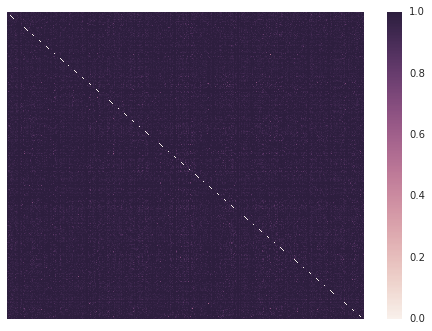

In [19]:
import xml.etree.ElementTree as etree
import pandas as pd
import re
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from scipy.spatial.distance import cosine
from collections import defaultdict,Counter
from sklearn.metrics.pairwise import cosine_similarity
import sklearn.metrics as metrics
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl



messageRow, streetRow, linkRow = {}, {}, {}
listOfRows = []
listOfRows2 = []
file_path = "stackoverflow-posts-2015.xml"
for event, element in ET.iterparse(file_path):
    messageRow = {}
    if  element.tag == 'row' and element.get('PostTypeId')== '2':
        messageRow['OwnerUserId'] = element.get('OwnerUserId')
        messageRow['Id'] = element.get('ParentId')
        
        listOfRows.append(messageRow)
       
df4 = pd.DataFrame.from_records(listOfRows, columns=['OwnerUserId', 'Id'])
df2 = df4.groupby('OwnerUserId').size().sort_values(ascending=False)
df2 = df2.head(1000)
lis = df2.index.tolist()
data2={'OwnerUserId': lis }

df6=pd.DataFrame(data2)
merge1 = pd.merge(df6, df4, on=['OwnerUserId'], how='inner')

dfnew=df.drop('CreationDate',axis=1)
dfnew1=dfnew.drop('OwnerUserId',axis=1)

df7 = pd.merge(merge1,dfnew1,on=['Id'],how='inner')
del df7['Id']
Taglist = df7.groupby('OwnerUserId')['Tags'].apply(lambda x: x.tolist())

ll = []
for i in range(len(Taglist)):
    str1 = ' '.join(Taglist[i])
    ll.append(str1)
    

vectorizer = CountVectorizer(min_df=1)
tagvec = vectorizer.fit_transform(ll)
analyze = vectorizer.build_analyzer()
tagarr= tagvec.toarray()


s = metrics.pairwise_distances(tagarr,Y=None,metric='jaccard', n_jobs=1)

print s

sns.heatmap(s, xticklabels=False, yticklabels=False, linewidths=0)


First using iterparse we read the whole file and get all the post id=2 (answers) data and sort it for the top 1000 users who have answred the most questions. Following which we merge this data frame of users witht the original data frame and get all the tags for which the users have answred. We get a sorted list of users with their tags. 

We then convert the tag list into a format that can be vectorized. Using Count Vectorizer we vectorize this list and convet it to an array. Then we calculated and displayed the distance matrix using jaccard method . Here we can see that the principle daigonal elements are all zero as they are same and thus closset to each other. '1' represents maximum dis-similarity. Finally we have plotted a heat map for the whole data.

Let's plot a subset of the distance matrix. Order the pairwise distance in your distance matrix (excluding the entries along the diagonal) in increasing order and pick user pairs until you have 100 unique users. See [Lecture 3](https://github.com/datascience16/lectures/blob/master/Lecture3/Distance-Functions.ipynb) for examples. **(10 pts)**

In [33]:
#get all elements of matrix in 1d array
dist = s.flatten()

#get argsorted index of above 1d array
inde =np.argsort(dist)[::-1]

#mod with number of users to get row number and column number
indexval = inde % 1000

#sort the elements of 1d array in descending order
#distance= sorted(dist,reverse=True)

#top 100 index value
index = indexval[:100]

users =pd.DataFrame(index)
#adding a new index column
users.columns=['indexnew']

df7['indexnew'] = df7.index

finalusers = pd.merge(df7, users, on=['indexnew'], how='inner')
del finalusers['indexnew']

Taglistfinal = finalusers.groupby('OwnerUserId')['Tags'].apply(lambda x: x.tolist())

lol = []
for i in range(0,len(Taglistfinal)):
    str1 = ' '.join(Taglistfinal[i])
    lol.append(str1)
    
vectorizer = CountVectorizer(min_df=1)
tagsvec = vectorizer.fit_transform(lol)
tagsarr= tagsvec.toarray()
sim = metrics.pairwise_distances(tagsarr,Y=None,metric='jaccard', n_jobs=1)
print sim

[[ 0.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   0.8  1.
   1.   1.   1. ]
 [ 1.   0.   1.   1.   1.   1.   1.   1.   1.   1.   0.5  1.   1.   1.   0.
   0.   0.   0. ]
 [ 1.   1.   0.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   0.   1.   0.   1.   1.   0.   0.   0.5  0.   0.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   1.   0.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   0.   1.   0.   1.   1.   0.   0.   0.5  0.   0.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   1.   1.   1.   0.   1.   1.   1.   1.   1.   1.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   1.   1.   1.   1.   0.   1.   1.   1.   1.   1.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   0.   1.   0.   1.   1.   0.   0.   0.5  0.   0.   1.   1.
   1.   1.   1. ]
 [ 1.   1.   1.   0.   1.   0.   1.   1.   0.   0.   0.5  0.   0.   1.   1.
   1.   1.   1. ]
 [ 1.   0.5  1.   0.5  1.   0.5  1.   1.   0.5  0.5  0.   0.

Above we have plotted a subset of the distance matrix. First we ordered the pairwise distance in our distance matrix 
from the above part (excluding the entries along the diagonal) in increasing order and picked user pairs until we have 
100 unique users. This we did using their first tags in their posts. Then we converted the tag list to we format that
could be vectorized and then displayed the pair wise distance matrix.

Next, let's create some time series from the data. Look at the top 100 users with the most question posts. For each user, your time series will be the `CreationDate` of the questions posted by that user. You may want to make multiple time series for each user based on the first tag of the questions. Compare the time series using one of the methods discussed in class. Document your findings. **(30 pts)**

You may find the [pandas.DataFrame.resample module](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html) helpful.

As plotting for 100 users will take a lot of space, first we are going to plot time series for the top 10 users who 
have posted the most questions over the year. 

Number of questions posted by month for User ID 875317


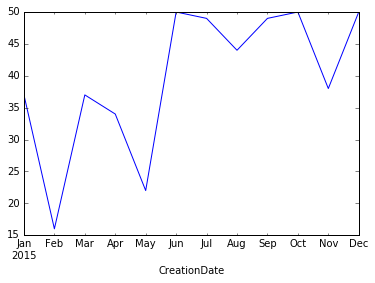

Number of questions posted by month for User ID 2786156


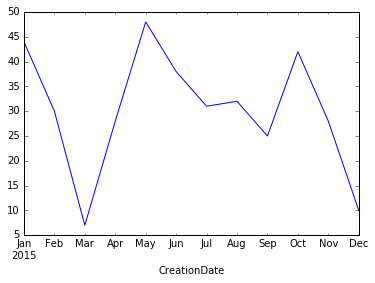

Number of questions posted by month for User ID 1194415


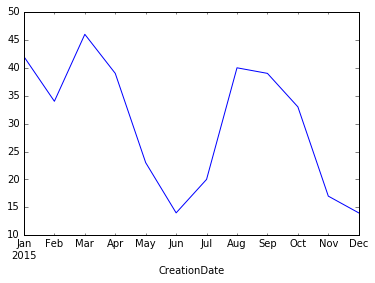

Number of questions posted by month for User ID 651174


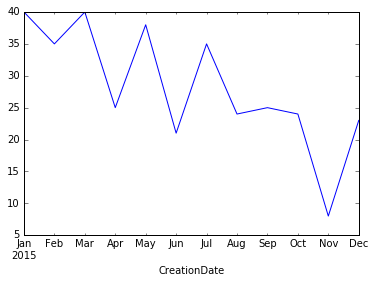

Number of questions posted by month for User ID 1833945


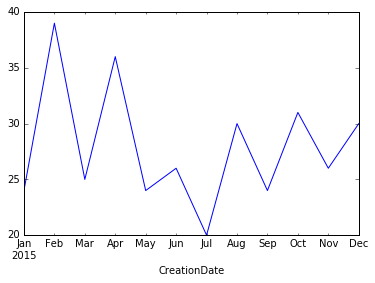

Number of questions posted by month for User ID 1223975


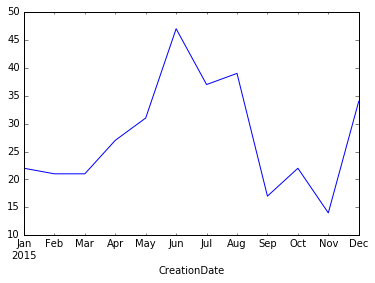

Number of questions posted by month for User ID 4381665


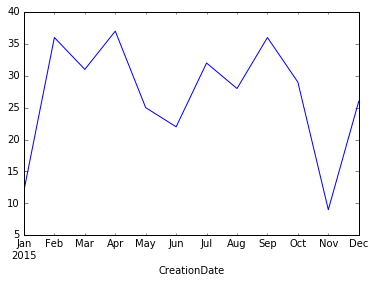

Number of questions posted by month for User ID 4009451


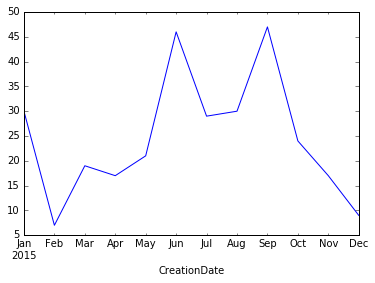

Number of questions posted by month for User ID 2674303


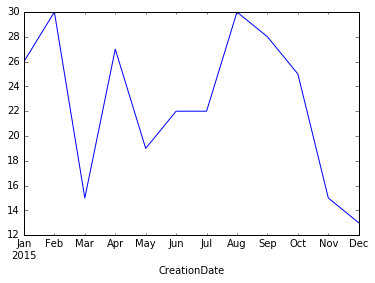

Number of questions posted by month for User ID 784597


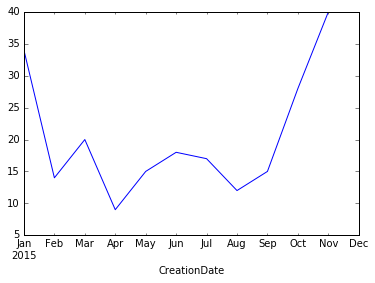

In [2]:
import datetime
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import sklearn.metrics as metrics
from sklearn.metrics import pairwise_distances

%matplotlib inline 

df10 = df.groupby('OwnerUserId').count().sort_values(by='Id',ascending=False)
df10 = df10.head(10)
lis2 = df10.index.tolist()
data3={'OwnerUserId': lis2 }

df11=pd.DataFrame(data3)
merge3 = pd.merge(df11, df, on=['OwnerUserId'], how='inner')
merge3=merge3.drop('Id',axis=1)

times = pd.to_datetime(merge3.CreationDate)
for i in range(len(lis2)):
    grouped = merge3.groupby('OwnerUserId').get_group(lis2[i])
    aa = grouped.groupby([times]).OwnerUserId.count().resample('M',how='sum')
    print "Number of questions posted by month for User ID", lis2[i] 
    aa.plot()
    plt.show()

First we counted the number of questions posted by the owneruserid and then sorted the data into a data frame, after 
that we took only the top 10 users out of that using the head function and then using a loop we have plotted the time 
series for the top 10 users for  how many questions where posted by them per month over the year.

Now for the tags as there are a lot many of them we first want to get the top 10 tags for which the answers where posted using a count() function as done below we get the following output.

In [4]:
dftags=df.groupby('Tags').count()
dftags=dftags.sort_values(by='Id', ascending=[False])
dftags=dftags.head(10)

print dftags

                Id  CreationDate  OwnerUserId
Tags                                         
javascript  282835        282835       281218
java        239119        239119       237807
php         170755        170755       169738
c#          167834        167834       166989
android     149927        149927       149159
python      145444        145444       144576
ios         106409        106409       105909
c++          81868         81868        81553
html         49119         49119        48806
jquery       43440         43440        43226


Above we can see the top 10 tags with there count. Now using the Creation Dates for these tags, we are generate a time
series for all of them weekly basis for the entire year's data.

In [8]:
import datetime
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import sklearn.metrics as metrics
from sklearn.metrics import pairwise_distances

d11=df
newpd=pd.DataFrame()
for tag in ['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]
    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)
    lis22 = d41.index.tolist() 
    dat22 = {'OwnerUserId': lis22 }
    df202=pd.DataFrame(dat22)
    mrg11 = pd.merge(df202, df, on=['OwnerUserId'], how='inner')
    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['CreationDate']))
    
    times = pd.to_datetime(mrg11.CreationDate)
    data1001=mrg11.groupby([times]).Tags.count().resample('W',how='sum')
    df1001=pd.DataFrame(data1001)
    newpd=pd.concat([df1001,newpd],axis=1,join='inner')
    
newpd.columns=['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']
print newpd
    

              javascript  java  php   c#  android  python  ios  c++  html  \
CreationDate                                                                
2015-01-04            32    38   33   48       45      45   48   49    69   
2015-01-11           141   153  134  126      142     137  131  143   209   
2015-01-18           120   151  131  139      149     136  140  168   225   
2015-01-25           119   159  102  147      154     154  165  154   234   
2015-02-01           140   154  111  140      185     140  130  119   206   
2015-02-08           157   153  129  149      178     140  165  137   190   
2015-02-15           146   199  122  199      189     130  155  126   211   
2015-02-22           151   194  123  183      151     141  148  176   183   
2015-03-01           182   211  147  189      156     149  169  184   238   
2015-03-08           162   170  147  166      163     148  160  170   212   
2015-03-15           133   163  126  175      198     139  146  182   219   

Above we have generated the time series for the top 10 tags used by the top 100 users for every week over the whole year. We can see for each week, how many questions where posted on the particular tag topic for the the top 10 tags.

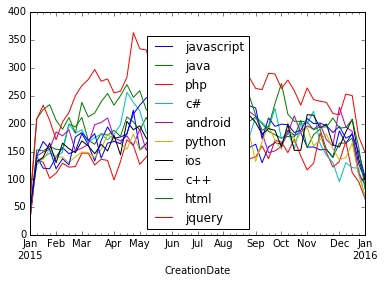

In [23]:
import datetime
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import sklearn.metrics as metrics
from sklearn.metrics import pairwise_distances

%matplotlib inline 


d11=df
newpdtags=pd.DataFrame()
for tag in ['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]
#print d15
        
    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)
    
    lis22 = d41.index.tolist()
    
    dat22 = {'OwnerUserId': lis22 }
    df202=pd.DataFrame(dat22)
    mrg11 = pd.merge(df202, df, on=['OwnerUserId'], how='inner')

    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['CreationDate']))

    times = pd.to_datetime(mrg11.CreationDate)
    data1001=mrg11.groupby([times]).Tags.count().resample('W',how='sum')
    df1001=pd.DataFrame(data1001)
    newpdtags=pd.concat([df1001,newpdtags],axis=1,join='inner')
    
newpdtags.columns=['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']
newpdtags.plot()


Finally we have plotted the time series for the top 10 tags for the top 100 users, all of them togetehr in one box so we can see the difference and pattern among them. We can see that january and december get the least number of questions posted.

Plot the 2 most similar and the 2 most different time series. **(10 pts)**

Now we will first print the similarity matrix which we calculated using jaccard pair wise distance and we will plot the 2 most similar and 2 most dis similar trends of tags.

Similarity Matrix :
[[  0.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.]
 [  1.   0.   1.   1.   1.   1.   1.   1.   1.   1.   1.]
 [  1.   1.   0.   1.   1.   1.   1.   1.   1.   1.   1.]
 [  1.   1.   1.   0.   1.   1.  nan   1.   1.   1.   1.]
 [  1.   1.   1.   1.   0.   1.   1.   1.   1.   1.   1.]
 [  1.   1.   1.   1.   1.   0.   1.   1.   1.   1.   1.]
 [  1.   1.   1.  nan   1.   1.   0.   1.   1.   1.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   0.   1.   1.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   1.   0.   1.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   1.   1.   0.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   0.]]
Time series for 2 most similar tags 'c#' and 'jquery' : 


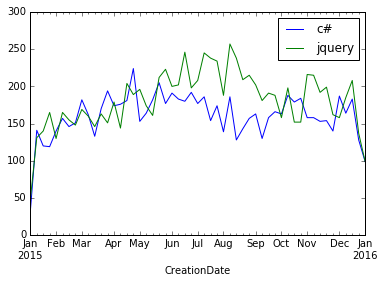

Time series for 2 most dissimilar tags 'php' and 'jqurery' : 


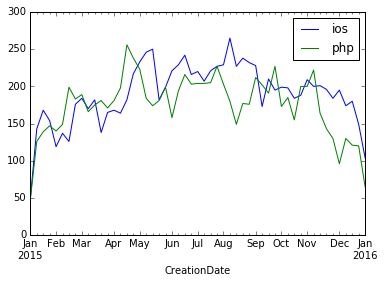

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import xml.etree.ElementTree as ET
import pandas as pd
import re
%matplotlib inline
newpd11=pd.DataFrame()
newpd22=pd.DataFrame()
newlist=newpd.values.T.tolist()
newdic=newpd.to_dict()

vectorizer = CountVectorizer(min_df=1) 
tagsvec = vectorizer.fit_transform(newdic)  
tagsarr= tagsvec.toarray()  
sim = metrics.pairwise_distances(tagsarr,Y=None,metric='jaccard', n_jobs=1) 

print "Similarity Matrix :"
print sim

d11=df

print "Time series for 2 most similar tags 'c#' and 'jquery' : "  
for tag in ['c#', 'jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]

        
    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)
   
    lis22 = d41.index.tolist()
    
    dat22 = {'OwnerUserId': lis22 }
    df202=pd.DataFrame(dat22)
    mrg11 = pd.merge(df202, df, on=['OwnerUserId'], how='inner')

    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['CreationDate']))

    times = pd.to_datetime(mrg11.CreationDate)
    data1001=mrg11.groupby([times]).Tags.count().resample('W',how='sum')
    df1001=pd.DataFrame(data1001)
    newpd11=pd.concat([df1001,newpd11],axis=1,join='inner')

newpd11.columns=['c#', 'jquery' ]   
newpd11.plot()
plt.show()
print "Time series for 2 most dissimilar tags 'php' and 'jqurery' : " 
for tag in ['ios', 'php']:
    
    d15=d11.loc[d11['Tags'] == tag]

    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)
   
    lis22 = d41.index.tolist()
    
    dat22 = {'OwnerUserId': lis22 }
    df202=pd.DataFrame(dat22)
    mrg11 = pd.merge(df202, df, on=['OwnerUserId'], how='inner')

    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['CreationDate']))

    times = pd.to_datetime(mrg11.CreationDate)
    data1001=mrg11.groupby([times]).Tags.count().resample('W',how='sum')
    df1001=pd.DataFrame(data1001)
    newpd22=pd.concat([df1001,newpd22],axis=1,join='inner')
   
newpd22.columns=['ios', 'php' ]   
newpd22.plot()
plt.show()

In [ ]:
# Code for setting the style of the notebook
from IPython.core.display import HTML
def css_styling():
    styles = open("/custom.css", "r").read()
    return HTML(styles)
css_styling()